# As a data analyst confronted with the 2020 UK accident dataset, I have been have been given the task to advise government agencies about how best to improve road safety and also develop a model that will predict such accidents and the injuries that they incur.This project addresses the following: 1.Are there significant hours of the day, and days of the week, on which accidents occur?2.For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? Here, I have focused on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc. 3.For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved? I have developed the apriori algorithm, explore the impact of selected variables on accident severity, and identified accidents in these region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. I have done this by filtering on LSOA, or police region. I deployed clustering on this data and analysed what the clusters reveal about the distribution of accidents in our region, I also implemented outlier detection methods, identified unusual entries in the data set, and developed a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures.


In [1]:
# Imports
import sqlite3 as sq3
import pandas.io.sql as pds
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Create a variable, `path`, containing the path to the `accident.db` contained in `sample_data/`
path = r'accident_data_v1.0.0_2023.db'

In [3]:
# connecting the database
con = sq3.Connection(path)
cur = con.cursor()

In [4]:
# Select table names from the Database
tables = cur.execute(f"SELECT name FROM sqlite_master WHERE type='table';").fetchall()

In [5]:
tables

[('accident',), ('casualty',), ('vehicle',), ('lsoa',)]

## Extraction of 2020 Data

In [6]:
# Create a variable, `query`, containing a SQL query which reads in all data from the `` table

query = """
SELECT *
FROM accident
WHERE accident_year = 2020;
"""
accident_df = pd.read_sql(query, con)
accident_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763


In [7]:
accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64  
 10

In [8]:
# Create a variable, `query`, containing a SQL query which reads in all data from the `` table

query = """
SELECT *
FROM vehicle
WHERE accident_year = 2020;
"""
vehicle_df = pd.read_sql(query, con)
vehicle_df.head()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1


In [9]:
vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

In [10]:
# Create a variable, `query`, containing a SQL query which reads in all data from the `` table

query = """
SELECT *
FROM lsoa;
"""
lsoa = pd.read_sql(query, con)
lsoa.head()

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311


In [11]:
lsoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34378 entries, 0 to 34377
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   objectid       34378 non-null  int64  
 1   lsoa01cd       34378 non-null  object 
 2   lsoa01nm       34378 non-null  object 
 3   lsoa01nmw      34378 non-null  object 
 4   shape__area    34378 non-null  float64
 5   shape__length  34378 non-null  float64
 6   globalid       34378 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 1.8+ MB


In [12]:
# Create a variable, `query`, containing a SQL query which reads in all data from the `` table

query = """
SELECT *
FROM casualty
WHERE accident_year = 2020;
"""
casualty_df = pd.read_sql(query, con)
casualty_df.head()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3


In [13]:
casualty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

#### Merging accidents and casualty tables

In [14]:
## dropping inital nan values
accident_df.dropna(inplace=True)

In [15]:
print("No. of rows: {}".format(accident_df.shape[0]))
print("No. of cols: {}".format(accident_df.shape[1]))

No. of rows: 91185
No. of cols: 36


In [16]:
accident_df.isnull().sum() / len(accident_df) * 100

accident_index                                 0.0
accident_year                                  0.0
accident_reference                             0.0
location_easting_osgr                          0.0
location_northing_osgr                         0.0
longitude                                      0.0
latitude                                       0.0
police_force                                   0.0
accident_severity                              0.0
number_of_vehicles                             0.0
number_of_casualties                           0.0
date                                           0.0
day_of_week                                    0.0
time                                           0.0
local_authority_district                       0.0
local_authority_ons_district                   0.0
local_authority_highway                        0.0
first_road_class                               0.0
first_road_number                              0.0
road_type                      

In [17]:
accident_df.fillna(accident_df.mean(), inplace=True)

C:\Users\bosun\AppData\Local\Temp/ipykernel_11364/172928464.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  accident_df.fillna(accident_df.mean(), inplace=True)


In [18]:
accident_df.duplicated().sum()

0

In [19]:
numerical_data = accident_df.select_dtypes(include='number')
num_cols = numerical_data.columns
len(num_cols)

29

In [20]:
categorical_data = accident_df.select_dtypes(include='object')
cat_cols = categorical_data.columns
len(cat_cols)

7

In [21]:
accident_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763


In [22]:
# Filter entries with the specified prefix
# filtered_entries = loc_df[loc_df['lsoa01nm'].str.startswith(target_prefix)]
filtered_entries = accident_df[accident_df['police_force'] == 16]

filtered_entries

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
37750,2020160914781,2020,160914781,510156.0,429221.0,-0.331047,53.747751,16,2,1,...,0,4,1,1,0,0,1,1,2,E01033109
37751,2020160914930,2020,160914930,506050.0,428813.0,-0.393424,53.744936,16,3,2,...,5,1,1,1,0,0,1,1,2,E01012777
37752,2020160915008,2020,160915008,497660.0,402806.0,-0.528743,53.512895,16,3,1,...,0,4,1,1,0,0,2,1,2,E01013325
37753,2020160915028,2020,160915028,510449.0,434112.0,-0.324858,53.791630,16,2,1,...,0,4,1,1,0,0,1,1,2,E01012788
37754,2020160915041,2020,160915041,526236.0,410340.0,-0.095008,53.574501,16,3,1,...,0,4,1,1,0,0,1,1,2,E01013220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39454,2020161014491,2020,161014491,489433.0,408637.0,-0.651104,53.566753,16,3,2,...,0,1,1,1,0,0,1,2,2,E01013239
39455,2020161014528,2020,161014528,503756.0,439285.0,-0.424674,53.839482,16,3,2,...,0,4,1,1,0,0,1,2,2,E01013041
39456,2020161014544,2020,161014544,511525.0,433149.0,-0.308880,53.782750,16,3,1,...,0,1,1,1,0,0,1,2,2,E01012907
39457,2020161014546,2020,161014546,485978.0,408912.0,-0.703181,53.569801,16,3,2,...,0,1,1,1,0,1,2,2,1,E01013286


In [23]:
filtered_entries.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1709 entries, 37750 to 39458
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               1709 non-null   object 
 1   accident_year                                1709 non-null   int64  
 2   accident_reference                           1709 non-null   object 
 3   location_easting_osgr                        1709 non-null   float64
 4   location_northing_osgr                       1709 non-null   float64
 5   longitude                                    1709 non-null   float64
 6   latitude                                     1709 non-null   float64
 7   police_force                                 1709 non-null   int64  
 8   accident_severity                            1709 non-null   int64  
 9   number_of_vehicles                           1709 non-null   int64  


In [24]:
accident_df['accident_severity'].value_counts()

3    71441
2    18353
1     1391
Name: accident_severity, dtype: int64

In [25]:
accident_casualty = pd.merge(accident_df,casualty_df, on='accident_index')
accident_casualty.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115567 entries, 0 to 115566
Data columns (total 54 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               115567 non-null  object 
 1   accident_year_x                              115567 non-null  int64  
 2   accident_reference_x                         115567 non-null  object 
 3   location_easting_osgr                        115567 non-null  float64
 4   location_northing_osgr                       115567 non-null  float64
 5   longitude                                    115567 non-null  float64
 6   latitude                                     115567 non-null  float64
 7   police_force                                 115567 non-null  int64  
 8   accident_severity                            115567 non-null  int64  
 9   number_of_vehicles                           115567 non-nul

In [26]:
casualty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

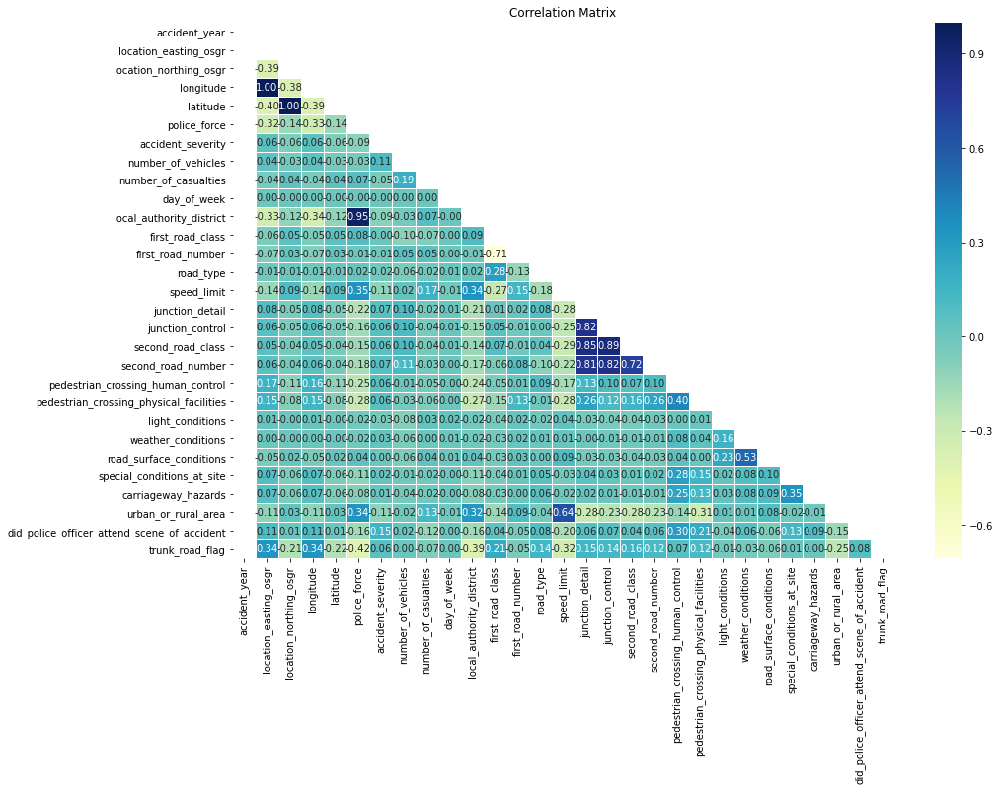

In [27]:
plt.figure(figsize = (15,10))
corr = accident_df.corr(method='spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))
cormat = sns.heatmap(corr, mask=mask, annot=True, cmap='YlGnBu', linewidths=1, fmt=".2f")
cormat.set_title('Correlation Matrix')
plt.show()

In [28]:
def get_corr(data, threshold):
    corr_col = set()
    cormat = data.corr()
    for i in range(len(cormat.columns)):
        for j in range(i):
            if abs(cormat.iloc[i, j])>threshold:
                col_name = cormat.columns[i]
                corr_col.add(col_name)
    return corr_col

corr_features = get_corr(accident_df, 0.80)
print(corr_features)

{'latitude', 'longitude', 'local_authority_district', 'second_road_class'}


The above features are the only columns with corelation more than 80% hence we can drop that following columns

In [29]:
accident_df.drop(columns=['local_authority_district', 'second_road_class'],
        axis=1, inplace=True)

In [30]:
accident_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91185 entries, 0 to 91198
Data columns (total 34 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91185 non-null  object 
 1   accident_year                                91185 non-null  int64  
 2   accident_reference                           91185 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91185 non-null  int64  
 8   accident_severity                            91185 non-null  int64  
 9   number_of_vehicles                           91185 non-null  int64  
 10

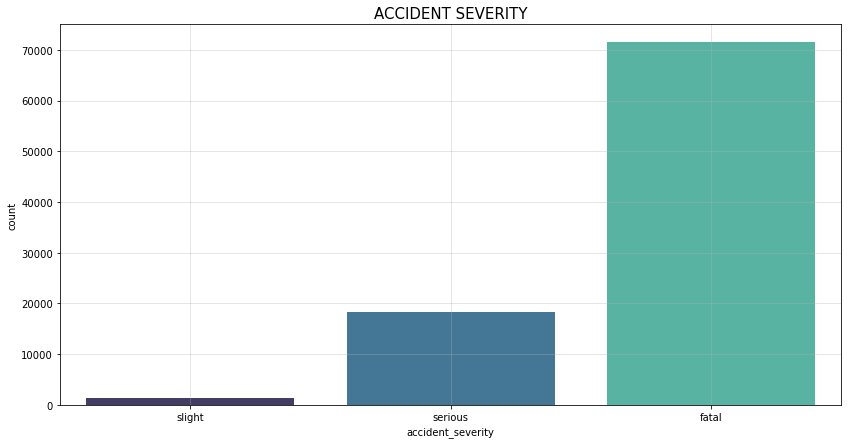

In [31]:
plt.figure(figsize=(14,7))
ax=sns.countplot(data= accident_df, x='accident_severity', palette = "mako")
plt.title('ACCIDENT SEVERITY', fontsize=15)
ax.set_xticklabels(['slight','serious','fatal'])
plt.grid(alpha=0.4)

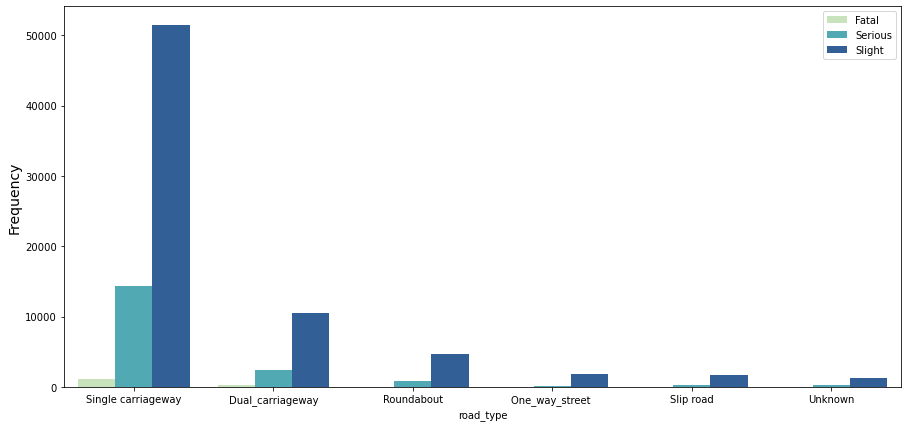

In [32]:
plt.figure(figsize=(15,7))
ax = sns.countplot(data= accident_df,x='road_type',hue='accident_severity',
                   order = accident_df["road_type"].value_counts().index, palette = "YlGnBu")
ax.set_xticklabels(['Single carriageway','Dual_carriageway','Roundabout',
                    'One_way_street ',
                    'Slip road','Unknown'])
plt.legend(['Fatal','Serious','Slight'])
plt.ylabel("Frequency", fontsize = 14)
plt.show()

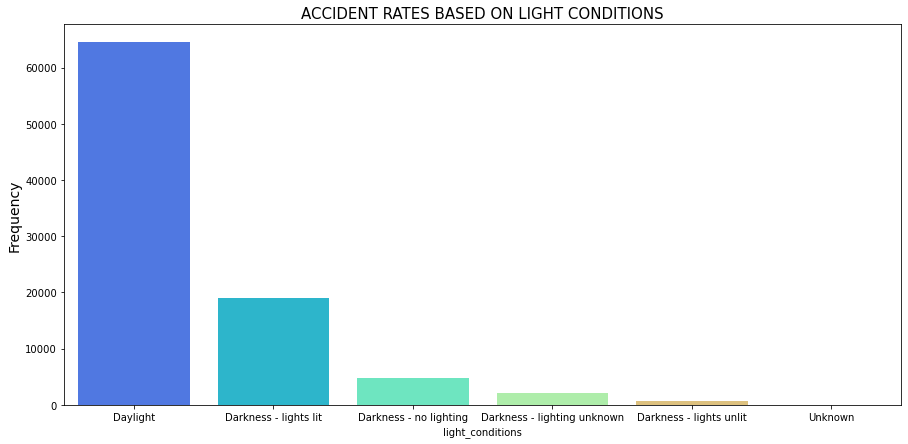

In [33]:
plt.figure(figsize=(15,7))
ax=sns.countplot(data= accident_df,x='light_conditions',
                 order = accident_df["light_conditions"].value_counts().index,
                 palette = "rainbow")
ax.set_xticklabels(['Daylight','Darkness - lights lit','Darkness - no lighting',
                    'Darkness - lighting unknown',
                    'Darkness - lights unlit', 'Unknown'])
plt.title('ACCIDENT RATES BASED ON LIGHT CONDITIONS',fontsize=15)
plt.ylabel("Frequency", fontsize = 14)
plt.show()

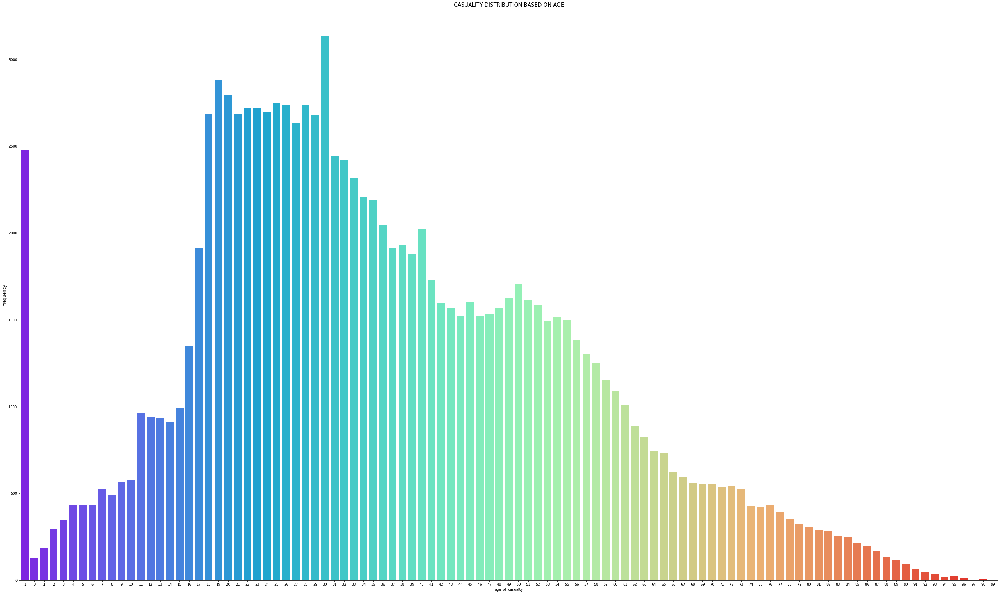

In [34]:
plt.figure(figsize=(50,30))
sns.countplot(data= casualty_df, x='age_of_casualty', palette = "rainbow")
plt.title('CASUALITY DISTRIBUTION BASED ON AGE', fontsize=15)
plt.ylabel("frequency", fontsize = 12)
plt.show()

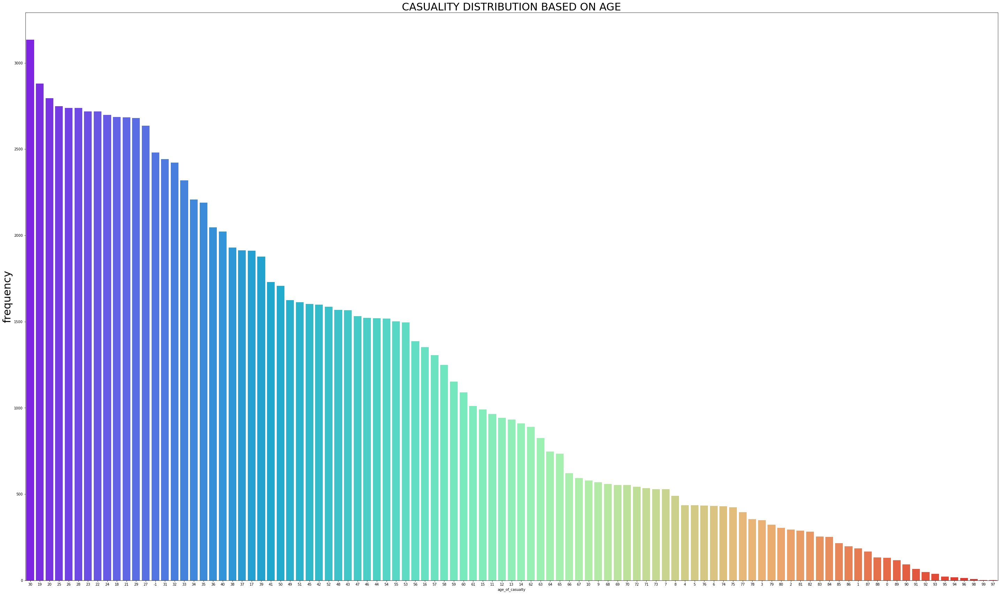

In [35]:
#Distrubution of casualities based on age:
plt.figure(figsize=(50,30))
sns.countplot(data= casualty_df, x = 'age_of_casualty',
              order = casualty_df["age_of_casualty"].value_counts().index,
              palette = "rainbow")
plt.title('CASUALITY DISTRIBUTION BASED ON AGE', fontsize=30)
plt.ylabel("frequency", fontsize = 30)
plt.show()

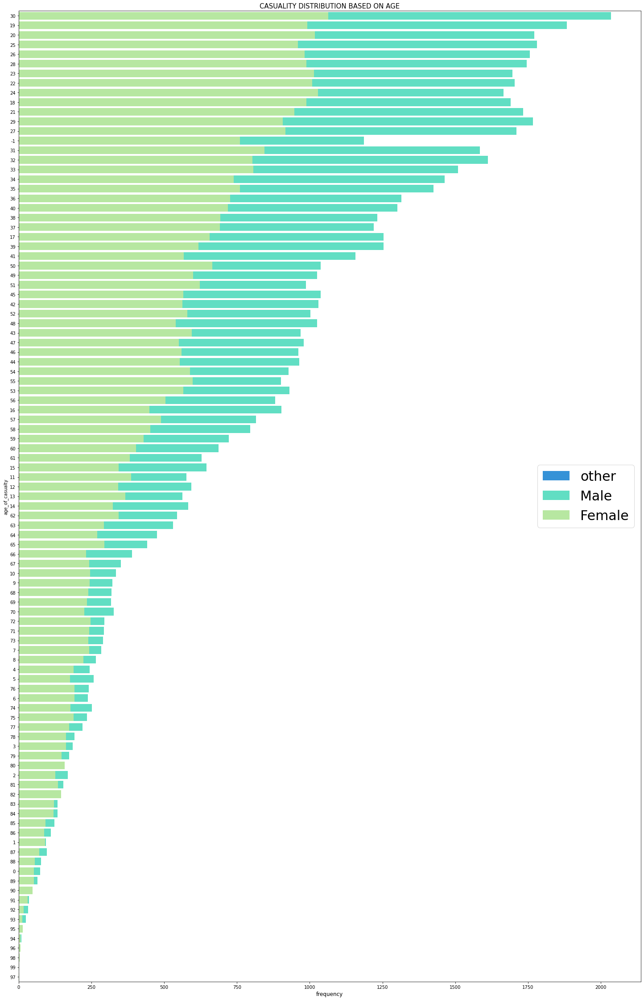

In [36]:
plt.figure(figsize=(25,40))
sns.countplot(data= casualty_df, y = 'age_of_casualty', hue = "sex_of_casualty",
              order = casualty_df["age_of_casualty"].value_counts().index,
              palette = "rainbow", dodge=False)
plt.title('CASUALITY DISTRIBUTION BASED ON AGE', fontsize=15)
plt.legend(['other','Male','Female'],prop={'size': 30}, loc=0)
plt.xlabel("frequency", fontsize = 12)
plt.show()

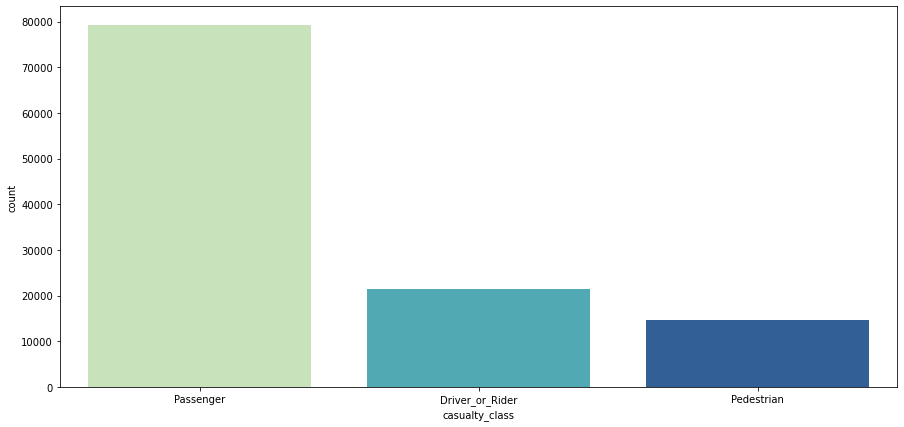

In [37]:
plt.figure(figsize = (15,7))
ax=sns.countplot(data= casualty_df, x='casualty_class', palette = "YlGnBu",order = casualty_df["casualty_class"].value_counts().index)
ax.set_xticklabels(['Passenger','Driver_or_Rider','Pedestrian'])
plt.show()

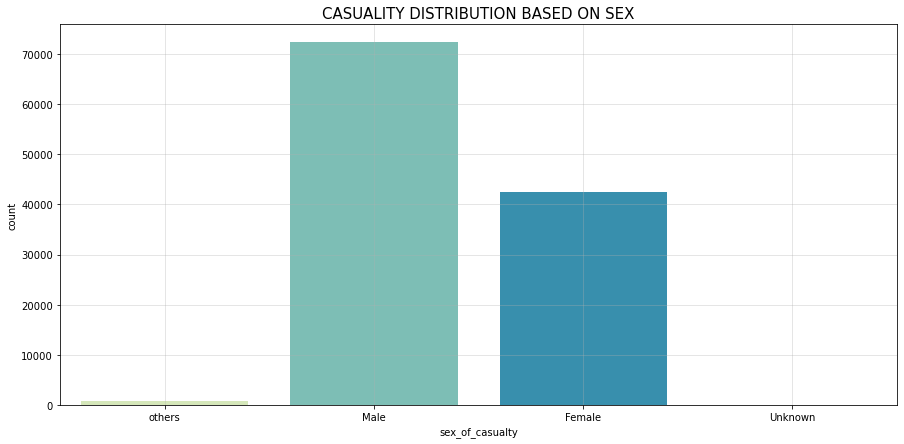

In [38]:
plt.figure(figsize=(15,7))
ax=sns.countplot(data= casualty_df, x='sex_of_casualty', palette = "YlGnBu")
plt.title('CASUALITY DISTRIBUTION BASED ON SEX', fontsize=15)
ax.set_xticklabels(['others','Male','Female', 'Unknown'])
plt.grid(alpha=0.4)

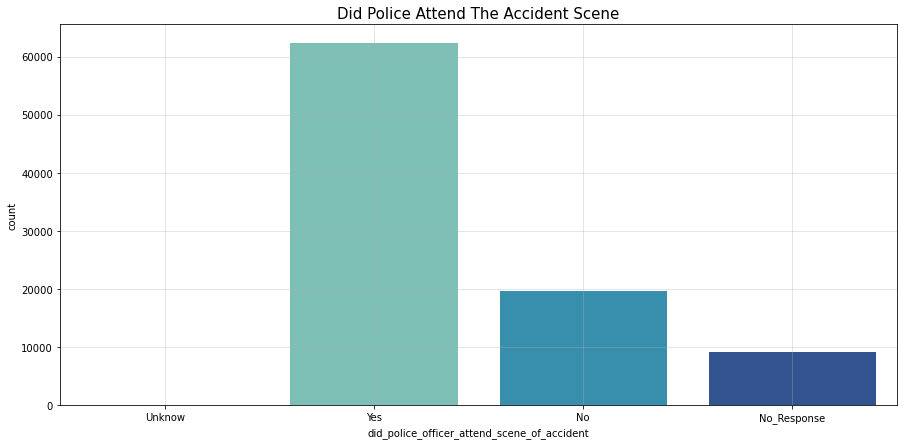

In [39]:
plt.figure(figsize=(15,7))
ax=sns.countplot(data= accident_df, x='did_police_officer_attend_scene_of_accident', palette = "YlGnBu")
plt.title('Did Police Attend The Accident Scene', fontsize=15)
ax.set_xticklabels(['Unknow','Yes','No', 'No_Response'])
plt.grid(alpha=0.4)

From the above analyses, it is clear that most of the accidents which occured within the provided region comes under the age group of 17-21, and notably most of them falls under the male category. Furthermore, it clearly shows that most of the accidents are occured in the daylight time at single carriageway. Most of the victims of these car accidents are drivers and most of them are males followed by females

In [40]:
accident_df['date']= pd.to_datetime(accident_df['date'])

# check
accident_df.iloc[:, 5:13].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91185 entries, 0 to 91198
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   longitude             91185 non-null  float64       
 1   latitude              91185 non-null  float64       
 2   police_force          91185 non-null  int64         
 3   accident_severity     91185 non-null  int64         
 4   number_of_vehicles    91185 non-null  int64         
 5   number_of_casualties  91185 non-null  int64         
 6   date                  91185 non-null  datetime64[ns]
 7   day_of_week           91185 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(5)
memory usage: 8.3 MB


### 1. Are there significant hours of the day, and days of the week, on which accidents occur?

In [41]:
# slice first and second string from time column
accident_df['Hour'] = accident_df['time'].str[0:2]

# convert new column to numeric datetype
accident_df['Hour'] = pd.to_numeric(accident_df['Hour'])

# drop null values in our new column
accident_df = accident_df.dropna(subset=['Hour'])

# cast to integer values
accident_df['Hour'] = accident_df['Hour'].astype('int')

In [42]:
# define a function that turns the hours into daytime groups
def when_was_it(hour):
    if hour >= 5 and hour < 10:
        return "morning rush (5-10)"
    elif hour >= 10 and hour < 15:
        return "office hours (10-15)"
    elif hour >= 15 and hour < 19:
        return "afternoon rush (15-19)"
    elif hour >= 19 and hour < 23:
        return "evening (19-23)"
    else:
        return "night (23-5)"

In [43]:
# apply thus function to our temporary hour column
accident_df['Daytime'] = accident_df['Hour'].apply(when_was_it)
accident_df[['time', 'Hour', 'Daytime']].head(8)

,time,Hour,Daytime
0,09:00,9,morning rush (5-10)
1,13:55,13,office hours (10-15)
2,01:25,1,night (23-5)
3,01:50,1,night (23-5)
4,02:25,2,night (23-5)
5,01:30,1,night (23-5)
6,03:43,3,night (23-5)
7,03:00,3,night (23-5)


In [44]:
weekday_counts = pd.DataFrame(accident_df.set_index('date').resample('1d')['accident_index'].size().reset_index())
weekday_counts.columns = ['date', 'Count']
#weekday_counts

weekday = weekday_counts['date'].dt.day_name()
#weekday

weekday_averages = pd.DataFrame(weekday_counts.groupby(weekday)['Count'].mean().reset_index())
weekday_averages.columns = ['Weekday', 'Average_Accidents']
weekday_averages.set_index('Weekday', inplace=True)
weekday_averages

,Average_Accidents
Weekday,
Friday,267.480769
Monday,247.230769
Saturday,235.557692
Sunday,220.576923
Thursday,268.301887
Tuesday,248.942308
Wednesday,255.396226


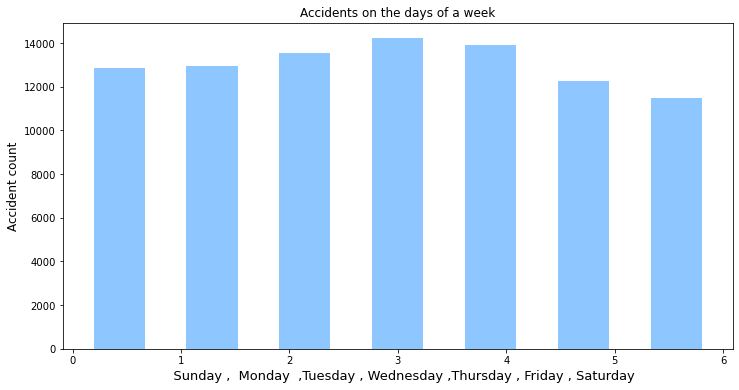

In [45]:
plt.figure(figsize=(12,6))
accident_df.date.dt.dayofweek.hist(bins=7,rwidth=0.55,alpha=0.5, color = 'dodgerblue')
plt.title('Accidents on the days of a week' , fontsize= 12)
plt.grid(False)
plt.ylabel('Accident count' , fontsize = 12)
plt.xlabel('   Sunday ,  Monday  ,Tuesday , Wednesday ,Thursday , Friday , Saturday' , fontsize = 13)

# remove all spines
sns.despine(ax=ax, top=True, right=True, left=True, bottom=True);

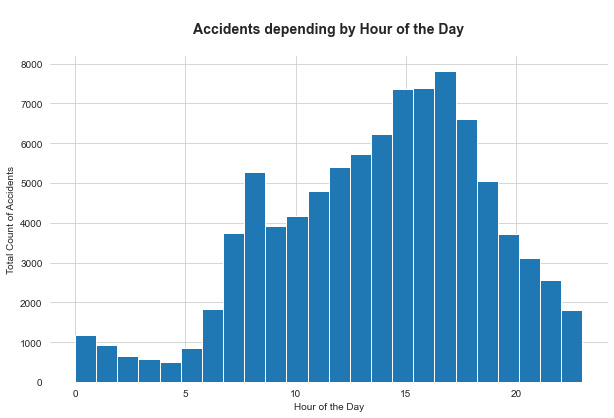

In [46]:
# prepare plot
sns.set_style('white')
fig, ax = plt.subplots(figsize=(10,6))

# plot
accident_df.Hour.hist(bins=24, ax=ax)
ax.set_title('\nAccidents depending by Hour of the Day\n', fontsize=14, fontweight='bold')
ax.set(xlabel='Hour of the Day', ylabel='Total Count of Accidents')

# remove all spines
sns.despine(top=True, right=True, left=True, bottom=True);

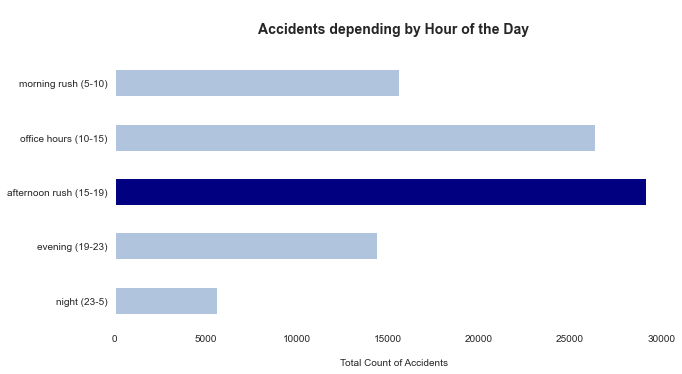

In [47]:
# prepare dataframe
order = ['night (23-5)', 'evening (19-23)', 'afternoon rush (15-19)', 'office hours (10-15)', 'morning rush (5-10)']
accident_df_sub = accident_df.groupby('Daytime').size().reindex(order)

# prepare barplot
fig, ax = plt.subplots(figsize=(10, 5))
colors = ['lightsteelblue', 'lightsteelblue', 'navy', 'lightsteelblue', 'lightsteelblue']

# plot
accident_df_sub.plot(kind='barh', ax=ax, color=colors)
ax.set_title('\nAccidents depending by Hour of the Day\n', fontsize=14, fontweight='bold')
ax.set(xlabel='\nTotal Count of Accidents', ylabel='')

# remove all spines
sns.despine(top=True, right=True, left=True, bottom=True);

In [48]:
from sklearn.cluster import KMeans

C:\Users\bosun\anaconda3\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\bosun\anaconda3\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")
C:\Users\bosun\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
C:\Users\bosun\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, wh

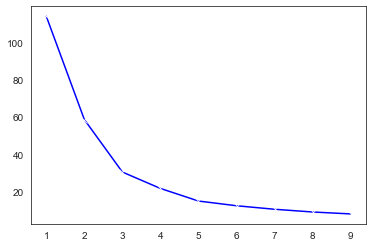

In [49]:
# using the elbow method to determine the best k for geographic clustering

max_k = 5

K = range(1,max_k+5, 1)

## iterations

distortions = []


for i in K:
    model = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    model.fit(filtered_entries[['latitude','longitude']])
    distortions.append(model.inertia_)


elbow_plot = sns.lineplot(x=K, y=distortions, marker='x', linestyle='-', color='blue')


plt.show()


In [50]:
# defines K-Means
kmeans = KMeans(n_clusters = 5, random_state = 42)
kmeans.fit(filtered_entries[['latitude','longitude']])

C:\Users\bosun\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\bosun\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


KMeans(n_clusters=5, random_state=42)

In [51]:

# predict labels

labels = kmeans.predict(filtered_entries[['latitude','longitude']])

centroids = kmeans.cluster_centers_
labels[0:5]

array([1, 1, 3, 1, 2])

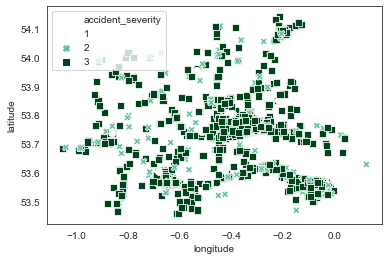

In [52]:
long_lat = sns.scatterplot(data=filtered_entries, x="longitude", y="latitude", hue='accident_severity',
                                    legend="full", s=50, palette="BuGn", style='accident_severity')

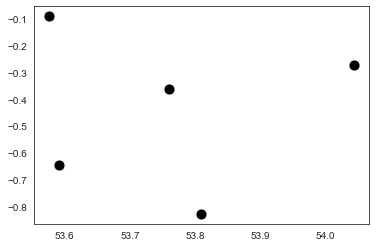

In [53]:
sns.scatterplot(x=centroids[:,0], y=centroids[:,1], color = 'black', s=120)
plt.show()

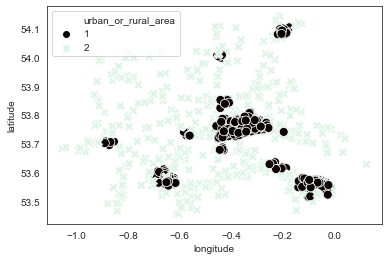

In [54]:
long_lat = sns.scatterplot(data=filtered_entries, x="longitude", y="latitude", hue='urban_or_rural_area',
                                    legend="full", s=80, palette="mako", style='urban_or_rural_area')

In [55]:
import folium

In [56]:
x_mean =filtered_entries.latitude.mean()
y_mean = filtered_entries.longitude.mean()

In [57]:
filtered_entries[['latitude','longitude']].min().tolist()

[53.456614, -1.05577]

In [58]:
df_min = filtered_entries[['latitude','longitude']].min().tolist()
df_max = filtered_entries[['latitude','longitude']].max().tolist()

df_x_min = filtered_entries[filtered_entries['latitude'] == df_min[0]][['latitude','longitude']].to_records()[0]
df_x_min = [df_x_min[1], df_x_min[2]]

df_y_min = filtered_entries[filtered_entries['longitude'] == df_min[1]][['latitude','longitude']].to_records()[0]
df_y_min = [df_y_min[1], df_y_min[2]]


df_x_max = filtered_entries[filtered_entries['latitude'] == df_max[0]][['latitude','longitude']].to_records()[0]
df_x_max = [df_x_max[1], df_x_max[2]]

df_y_max = filtered_entries[filtered_entries['longitude'] == df_max[1]][['latitude','longitude']].to_records()[0]
df_y_max = [df_y_max[1], df_y_max[2]]

In [59]:
# Uses lat then lon. The bigger the zoom number, the closer in you get
map_hooray = folium.Map(location=[x_mean,y_mean],
                    zoom_start = 8.3)
folium.Marker(df_x_min, popup='Min X').add_to(map_hooray)
folium.Marker(df_y_min, popup='Min Y').add_to(map_hooray)
folium.Marker(df_x_max, popup='Max X').add_to(map_hooray)
folium.Marker(df_y_max, popup='Max Y').add_to(map_hooray)

rec = [df_x_min,df_y_min,df_x_max,df_y_max]
# create a polygon with the coordinates
folium.Polygon(rec,
               color="blue",
               weight=.1,
               fill=True,
               fill_color="orange",
               fill_opacity=0.2).add_to(map_hooray)

map_hooray # Calls the map to display

### 2. For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

In [60]:
accident_vehicle = pd.merge(accident_df, vehicle_df, on='accident_index')
print(f"Number of duplicates: {accident_vehicle.duplicated().sum()}")

Number of duplicates: 0


In [61]:
selected_values = [3, 4, 5]
motorbike_df = accident_vehicle[accident_vehicle['vehicle_type'].isin(selected_values)]
motorbike_df.head()

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
12,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,...,6,1,37,7,114,1,5,YAMAHA XC115,8,1
33,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
36,2020010228097,2020,010228097,528428.0,179923.0,-0.150994,51.503659,1,3,2,...,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
58,2020010228148,2020,010228148,518467.0,185248.0,-0.292651,51.553691,1,3,1,...,6,1,20,4,125,1,0,HONDA GLR 125,2,1
77,2020010228207,2020,010228207,527038.0,170583.0,-0.174362,51.420033,1,3,2,...,6,1,22,5,125,1,9,HONDA WW125,7,1


In [62]:
motorbike_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12994 entries, 12 to 167344
Data columns (total 63 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   accident_index                               12994 non-null  object        
 1   accident_year_x                              12994 non-null  int64         
 2   accident_reference_x                         12994 non-null  object        
 3   location_easting_osgr                        12994 non-null  float64       
 4   location_northing_osgr                       12994 non-null  float64       
 5   longitude                                    12994 non-null  float64       
 6   latitude                                     12994 non-null  float64       
 7   police_force                                 12994 non-null  int64         
 8   accident_severity                            12994 non-null  int64        

In [63]:
motorbike_df['generic_make_model'].unique()

array(['YAMAHA XC115', '-1', 'PEUGEOT TWEET 125', 'HONDA GLR 125',
       'HONDA WW125', 'HONDA WW125EX2', 'HONDA SH125', 'HONDA NSC110E',
       'YAMAHA XJ6', 'YAMAHA MT125', 'PIAGGIO ZIP', 'HONDA NSC110MP',
       'HONDA SH 125', 'PIAGGIO VESPA', 'HONDA NSC110WH', 'SUZUKI RV 125',
       'YAMAHA GPD 125', 'HONDA NHX110WH',
       'HARLEY-DAVIDSON MODEL MISSING', 'HONDA FES125',
       'TRIUMPH BONNEVILLE', 'HONDA NSS 125 AD', 'PIAGGIO LIBERTY',
       'YAMAHA NXC 125', 'YAMAHA MT09', 'HONDA CBF125M', 'HONDA CBR900RR',
       'GILERA RUNNER 125', 'SUZUKI SV 650', 'KAWASAKI ZX600',
       'HARLEY-DAVIDSON FLS', 'YAMAHA MODEL MISSING', 'YAMAHA X-MAX 125',
       'YAMAHA YZF R125', 'YAMAHA XC 125', 'HONDA NC 750',
       'YAMAHA TRACER', 'PIAGGIO MP3', 'HONDA NC750XA', 'HONDA SH 125 AD',
       'HONDA PES 125', 'HONDA NT700V', 'HONDA NSS', 'HONDA NSC 110',
       'YAMAHA FZ6', 'YAMAHA YP 125', 'SUZUKI GSXR 600', 'KAWASAKI EX250',
       'YAMAHA FZ1', 'HONDA CBF125N', 'YAMAHA YBR 125', 'T

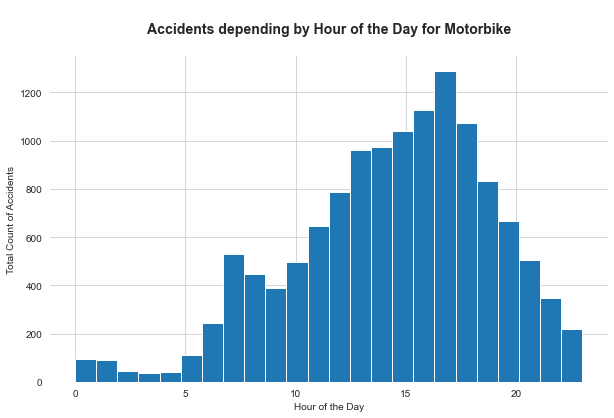

In [64]:
# prepare plot
sns.set_style('white')
fig, ax = plt.subplots(figsize=(10,6))

# plot
motorbike_df.Hour.hist(bins=24, ax=ax)
ax.set_title('\nAccidents depending by Hour of the Day for Motorbike\n', fontsize=14, fontweight='bold')
ax.set(xlabel='Hour of the Day', ylabel='Total Count of Accidents')

# remove all spines
sns.despine(top=True, right=True, left=True, bottom=True);

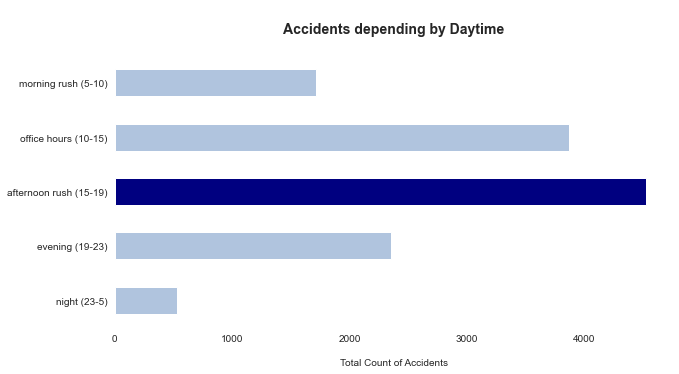

In [65]:
# prepare dataframe
order = ['night (23-5)', 'evening (19-23)', 'afternoon rush (15-19)', 'office hours (10-15)', 'morning rush (5-10)']
df_sub = motorbike_df.groupby('Daytime').size().reindex(order)

# prepare barplot
fig, ax = plt.subplots(figsize=(10, 5))
colors = ['lightsteelblue', 'lightsteelblue', 'navy', 'lightsteelblue', 'lightsteelblue']

# plot
df_sub.plot(kind='barh', ax=ax, color=colors)
ax.set_title('\nAccidents depending by Daytime\n', fontsize=14, fontweight='bold')
ax.set(xlabel='\nTotal Count of Accidents', ylabel='')

# remove all spines
sns.despine(top=True, right=True, left=True, bottom=True);

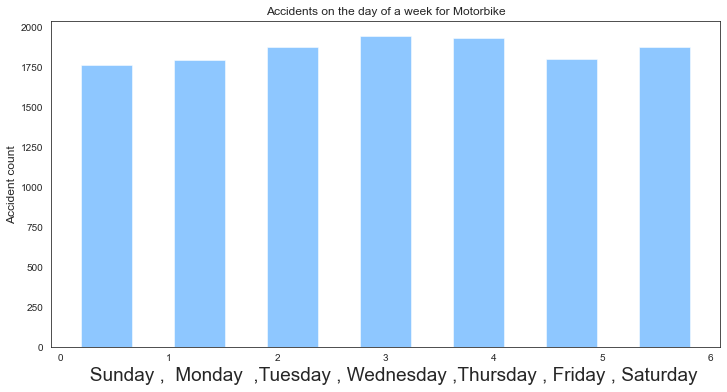

In [66]:
plt.figure(figsize=(12,6))
motorbike_df.date.dt.dayofweek.hist(bins=7,rwidth=0.55,alpha=0.5, color= 'dodgerblue')
plt.title('Accidents on the day of a week for Motorbike' , fontsize= 12)
plt.grid(False)
plt.ylabel('Accident count' , fontsize = 12)
plt.xlabel('   Sunday ,  Monday  ,Tuesday , Wednesday ,Thursday , Friday , Saturday' , fontsize = 19)

# remove all spines
sns.despine(ax=ax, top=True, right=True, left=True, bottom=True);

### 3. For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?


In [67]:
accident_casualty[accident_casualty['pedestrian_crossing_physical_facilities']==0]

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
5,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,6,3,6,9,0,0,0,0,1,8
6,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,6,3,6,9,0,0,0,0,-1,-1
7,2020010228012,2020,010228012,537193.0,177105.0,-0.025880,51.476278,1,3,1,...,5,3,0,0,0,0,0,9,1,4
8,2020010228014,2020,010228014,539764.0,179234.0,0.011959,51.494780,1,3,2,...,7,3,0,0,0,0,0,9,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115562,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,3,2,0,0,0,0,0,1,1,2
115563,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,9,3,10,1,0,0,0,0,1,10
115564,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
115565,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9


In [68]:
accident_casualty['time']

0         09:00
1         13:55
2         13:55
3         01:25
4         01:50
          ...  
115562    14:30
115563    15:05
115564    12:42
115565    14:00
115566    13:50
Name: time, Length: 115567, dtype: object

In [69]:
accident_casualty['pedestrian_crossing_human_control'].unique()

array([ 9,  0,  2,  1, -1], dtype=int64)

In [70]:
accident_casualty.duplicated().sum()

0

In [71]:
accident_casualty['decimal_time'] =  [int(date.split(':')[0]) + (int(date.split(':')[1]) / 60)  
                                                  for date in accident_casualty['time'] ]

In [72]:
pedestrian_day_hour = accident_casualty[accident_casualty['casualty_class'] == 3]

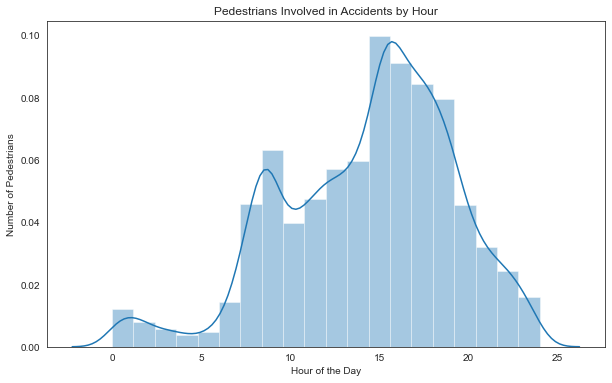

In [73]:
plt.figure(figsize=(10, 6))

sns.distplot(pedestrian_day_hour['decimal_time'], bins=20, kde=True)
plt.title('Pedestrians Involved in Accidents by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Pedestrians')
plt.show()

In [74]:
pedest_classs = accident_casualty[accident_casualty['casualty_class'] == 3].copy()

In [75]:
pedest = {0: 'Not a Pedestrian',
 1: "Crossing from driver's nearside",
 2: 'Crossing from nearside - masked by parked or stationary vehicle',
 3: "Crossing from driver's offside",
 4: 'Crossing from offside - masked by  parked or stationary vehicle',
 5: 'In carriageway, stationary - not crossing  (standing or playing)',
 6: 'In carriageway, stationary - not crossing  (standing or playing) - masked by parked or stationary vehicle',
 7: 'Walking along in carriageway, facing traffic',
 8: 'Walking along in carriageway, back to traffic',
 9: 'Unknown or other',
 -1: 'Data missing or out of range'}

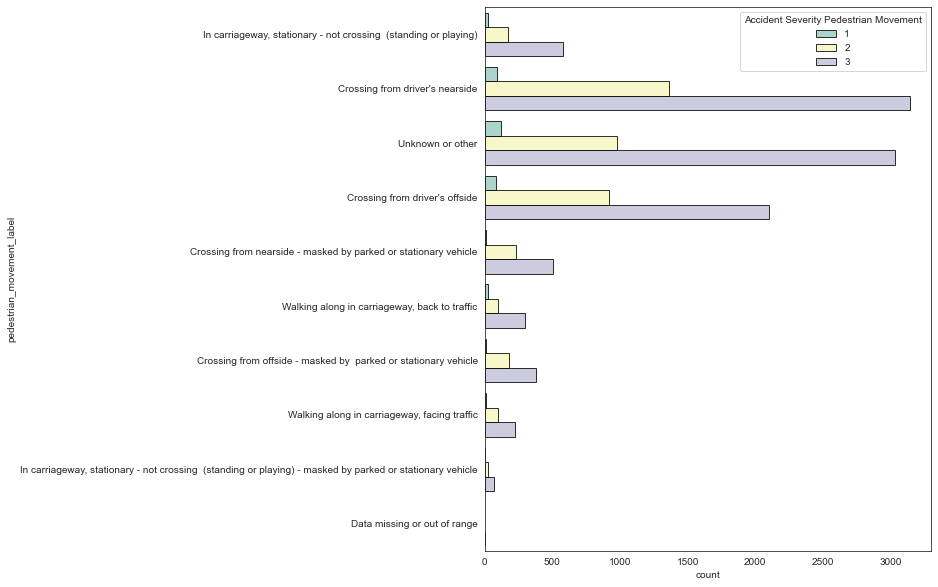

In [76]:
plt.figure(figsize=(8, 10))
pedest_classs['pedestrian_movement_label'] = pedest_classs['pedestrian_movement'].map(
    pedest)

casualty_by_pedestrian_movement =  sns.countplot(y='pedestrian_movement_label', hue='accident_severity', 
                                 data=pedest_classs, palette='Set3',
                                edgecolor='black', alpha=0.8, dodge=True)
plt.legend(title='Accident Severity Pedestrian Movement')
plt.show()

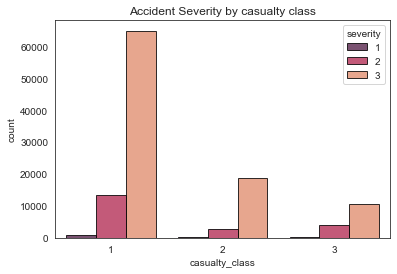

In [77]:
casualty_by_sex =  sns.countplot(x='casualty_class', hue='casualty_severity', 
                                 data=accident_casualty, palette='rocket',
                                edgecolor='black', alpha=0.8, dodge=True)
plt.legend(title='severity')
plt.title('Accident Severity by casualty class')
plt.show()

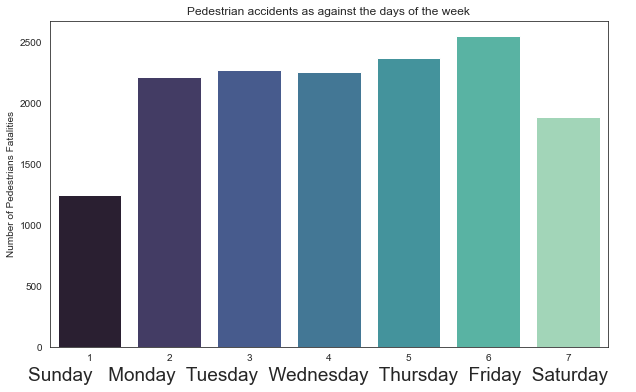

In [78]:

plt.figure(figsize=(10, 6))
sns.countplot(data=pedest_classs, x=pedest_classs['day_of_week'], palette='mako')
plt.title('Pedestrian accidents as against the days of the week')
plt.xlabel('Sunday   Monday  Tuesday  Wednesday  Thursday  Friday  Saturday    ' , fontsize = 19)
plt.ylabel('Number of Pedestrians Fatalities')
plt.show()


### 4. Using the apriori algorithm, explore the impact of selected variables on accident severity. 

In [79]:
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

In [80]:
a_severity = pd.get_dummies(accident_df.accident_severity, prefix = "severity")
a_severity

,severity_1,severity_2,severity_3
0,0,0,1
1,0,0,1
2,0,0,1
3,0,1,0
4,0,0,1
...,...,...,...
91194,0,1,0
91195,0,0,1
91196,0,1,0
91197,0,0,1


In [81]:
a_weather= pd.get_dummies(accident_df.weather_conditions, prefix = "weather")
a_weather

,weather_-1,weather_1,weather_2,weather_3,weather_4,weather_5,weather_6,weather_7,weather_8,weather_9
0,0,0,0,0,0,0,0,0,0,1
1,0,1,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
91194,0,1,0,0,0,0,0,0,0,0
91195,0,1,0,0,0,0,0,0,0,0
91196,0,1,0,0,0,0,0,0,0,0
91197,0,1,0,0,0,0,0,0,0,0


In [82]:
a_speed= pd.get_dummies(accident_df.speed_limit, prefix = "speed")
a_speed

,speed_-1,speed_20,speed_30,speed_40,speed_50,speed_60,speed_70
0,0,1,0,0,0,0,0
1,0,1,0,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...
91194,0,0,1,0,0,0,0
91195,0,0,1,0,0,0,0
91196,0,0,0,0,0,1,0
91197,0,0,1,0,0,0,0


In [83]:
new_df = pd.concat([a_severity, a_speed, a_weather], axis=1)
new_df

,severity_1,severity_2,severity_3,speed_-1,speed_20,speed_30,speed_40,speed_50,speed_60,speed_70,weather_-1,weather_1,weather_2,weather_3,weather_4,weather_5,weather_6,weather_7,weather_8,weather_9
0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
91195,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
91196,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
91197,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [84]:
freq_items_sets = apriori(new_df, min_support=0.2, use_colnames=True)
freq_items_sets

C:\Users\bosun\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.201272,(severity_2)
1,0.783473,(severity_3)
2,0.573099,(speed_30)
3,0.775566,(weather_1)
4,0.460032,"(severity_3, speed_30)"
5,0.603202,"(severity_3, weather_1)"
6,0.450206,"(speed_30, weather_1)"
7,0.359752,"(severity_3, speed_30, weather_1)"


In [85]:
rules = association_rules(freq_items_sets, metric="lift", min_threshold=0.5)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(severity_3),(speed_30),0.783473,0.573099,0.460032,0.587170,1.024553,0.011024,1.034085,0.110676
1,(speed_30),(severity_3),0.573099,0.783473,0.460032,0.802710,1.024553,0.011024,1.097503,0.056136
2,(severity_3),(weather_1),0.783473,0.775566,0.603202,0.769908,0.992705,-0.004433,0.975409,-0.032827
3,(weather_1),(severity_3),0.775566,0.783473,0.603202,0.777757,0.992705,-0.004433,0.974281,-0.031707
4,(speed_30),(weather_1),0.573099,0.775566,0.450206,0.785564,1.012891,0.005730,1.046624,0.029812
5,(weather_1),(speed_30),0.775566,0.573099,0.450206,0.580486,1.012891,0.005730,1.017610,0.056707
6,"(severity_3, speed_30)",(weather_1),0.460032,0.775566,0.359752,0.782016,1.008316,0.002967,1.029588,0.015274
7,"(severity_3, weather_1)",(speed_30),0.603202,0.573099,0.359752,0.596404,1.040665,0.014058,1.057744,0.098479
8,"(speed_30, weather_1)",(severity_3),0.450206,0.783473,0.359752,0.799084,1.019925,0.007028,1.077699,0.035533
9,(severity_3),"(speed_30, weather_1)",0.783473,0.450206,0.359752,0.459176,1.019925,0.007028,1.016587,0.090225


In [86]:
accident_df['urban_or_rural_area'].value_counts()

1    61737
2    29448
Name: urban_or_rural_area, dtype: int64

In [87]:
accident_df['urban_or_rural_area'].replace(3, 1, inplace=True)

In [88]:
accident_df['number_of_vehicles'].value_counts()[:10]

2     57381
1     25728
3      6240
4      1334
5       331
6        99
7        47
8        15
9         3
10        3
Name: number_of_vehicles, dtype: int64

In [89]:
accident_df['number_of_casualties'].value_counts()[:10]

1     74150
2     12218
3      3214
4      1063
5       349
6       115
7        43
8        14
9         7
11        4
Name: number_of_casualties, dtype: int64

### 5. Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region? 


In [90]:
most_crashes = filtered_entries[['latitude','longitude']].value_counts().head(1000)
most_crashes_df = most_crashes.reset_index()
max_accidents = most_crashes_df[0].max()
# Uses lat then lon. The bigger the zoom number, the closer in you get
map = folium.Map(location=[x_mean,y_mean],
                    zoom_start = 8.2)

for key,value in most_crashes.iteritems():
    point = [key[0],key[1]]
    radius_val = ((value / max_accidents) ** 2) * 6

    folium.CircleMarker(point
                    ,radius=radius_val
                    ,color="blue"
                    ,weight= value/max_accidents
                    ,fill=True
                    ,fill_color="red"
                    ,fill_opacity=1
                    ,popup=f'{value} Accidents Occured'
                   ).add_to(map)
map # Calls the map to display

In [91]:
cat_cols

Index(['accident_index', 'accident_reference', 'date', 'time',
       'local_authority_ons_district', 'local_authority_highway',
       'lsoa_of_accident_location'],
      dtype='object')

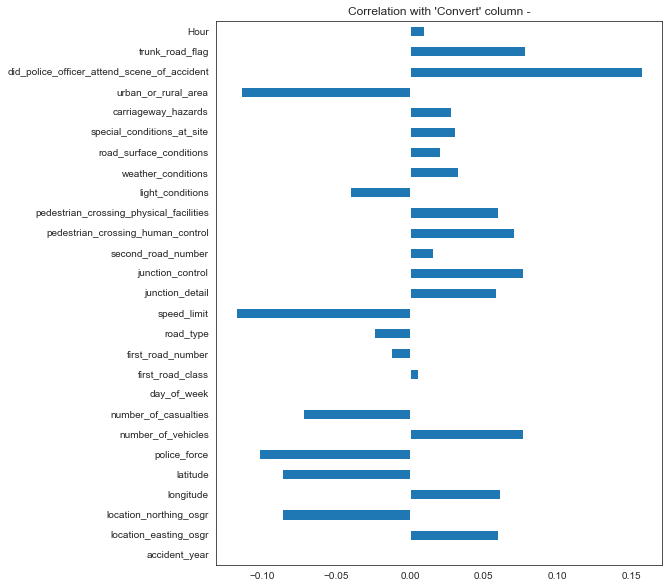

In [92]:
X = accident_df.drop(columns=['accident_severity'], axis=1)

plt.figure(figsize=(8, 10))
X.corrwith(accident_df['accident_severity']).plot(kind='barh',
                               title="Correlation with 'Convert' column -")
plt.show()

The Feature Accident Severity is highly correlated with the feature like "Number of Vechiles", "Number of casulaity" and "Speed Limit"

Feature Engineering and Scaling

In [93]:
cat_cols=[feature for feature in accident_df.columns if accident_df[feature].dtype=='O']
print(cat_cols)

['accident_index', 'accident_reference', 'time', 'local_authority_ons_district', 'local_authority_highway', 'lsoa_of_accident_location', 'Daytime']


In [94]:
for feature in cat_cols:
    print(f'The {feature} has following number of {len(accident_df[feature].unique())}')

The accident_index has following number of 91185
The accident_reference has following number of 91185
The time has following number of 1438
The local_authority_ons_district has following number of 378
The local_authority_highway has following number of 206
The lsoa_of_accident_location has following number of 25931
The Daytime has following number of 5


In [95]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()

In [96]:
for feature in cat_cols:
    accident_df[feature]=labelencoder.fit_transform(accident_df[feature])

In [97]:
# df.drop('year',axis=1,inplace=True)

In [98]:
accident_df["day"] = accident_df['date'].map(lambda x: x.day)
accident_df["month"] = accident_df['date'].map(lambda x: x.month)
accident_df["year"] = accident_df['date'].map(lambda x: x.year)

In [99]:
accident_df.drop("date",axis=1,inplace=True)
accident_df.drop("time",axis=1,inplace=True)

In [100]:
accident_df['accident_severity']=accident_df['accident_severity'].map({1:0,2:1,3:2})

In [101]:
dfnew=accident_df[['latitude','longitude','day','month','first_road_number','day_of_week','accident_severity']]

### 6. Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data? 


In [102]:
import plotly.express as px

In [103]:
px.box(accident_df, y="latitude")

In [104]:
px.box(accident_df, y="longitude")

In [105]:
px.box(accident_df, y="day")

In [106]:
px.box(accident_df, y="first_road_number")

In [107]:
px.box(accident_df, y="year")

In [108]:
px.box(accident_df, y="day_of_week")

### 7. Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?


Scaling of Data for Normalization

In [109]:
from sklearn.preprocessing import StandardScaler
features = [feature for feature in dfnew.columns if feature!='accident_severity']
x = dfnew.iloc[0:50000, :-1]
y = dfnew.iloc[0:50000,[-1]]
x = StandardScaler().fit_transform(x)

Using SMOTE to Treat imbalenced Dataset

In [110]:
%%time
from imblearn.over_sampling import RandomOverSampler

from sklearn.model_selection import train_test_split


from imblearn.over_sampling import SMOTE
oversample = RandomOverSampler()
x, y = oversample.fit_resample(x, y)

Wall time: 980 ms


In [111]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=0)

In [112]:
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier()
clf.fit(x_train, y_train)

C:\Users\bosun\anaconda3\lib\site-packages\sklearn\base.py:1151: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



ExtraTreesClassifier()

In [113]:
preds=clf.predict(x_test)

### Model Evaluation

In [114]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
score=accuracy_score(y_test,preds)
print(score)

0.9666666666666667


C:\Users\bosun\anaconda3\lib\site-packages\seaborn\matrix.py:70: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

C:\Users\bosun\anaconda3\lib\site-packages\seaborn\matrix.py:80: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



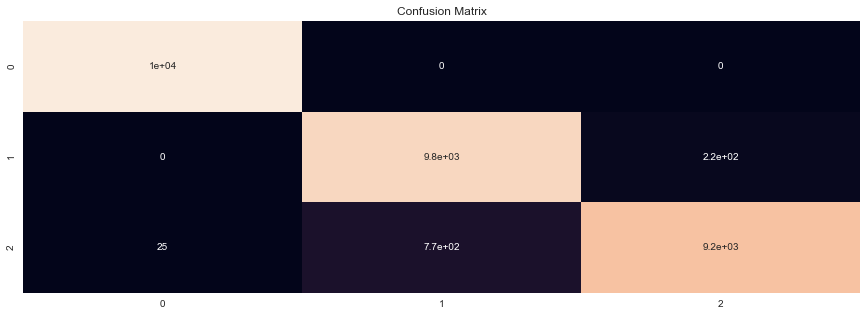

In [115]:
fig = plt.figure(figsize=(15,5))
conmat = confusion_matrix(y_test, preds)
sns.heatmap(conmat, annot=True, cbar=False)
plt.title("Confusion Matrix")
plt.show()

In [116]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10344
           1       0.93      0.98      0.95     10037
           2       0.98      0.92      0.95     10039

    accuracy                           0.97     30420
   macro avg       0.97      0.97      0.97     30420
weighted avg       0.97      0.97      0.97     30420



In [117]:
for feature, importance in zip(dfnew.columns, clf.feature_importances_):
    print(f"Feature: {feature}, Importance: {importance}")

Feature: latitude, Importance: 0.2410101980697397
Feature: longitude, Importance: 0.24290285138538614
Feature: day, Importance: 0.15113612277956825
Feature: month, Importance: 0.1241662541805891
Feature: first_road_number, Importance: 0.15596449126958017
Feature: day_of_week, Importance: 0.08482008231513667


In [118]:
import pickle
# Save the model to a file using pickle
with open('clf.pkl', 'wb') as file:
    pickle.dump(clf, file)

print("Model saved as 'clf.pkl'")

Model saved as 'clf.pkl'


In [119]:
# Load the model from the saved file
with open('clf.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

# Now you can use the loaded_model for predictions or further analysis